
### <center>Procesamiento Digital de Señales de Audio</center>
#### <center>Instituto de Ingeniería Eléctrica - UdelaR</center>
# Hoja de Ejercicios 1 - Curso 2024
## Introducción al procesamiento de señales de audio.
### Procesamiento de audio en el dominio del tiempo - Percepción auditiva.

## Pautas para el práctico
 - La realización del presente trabajo es individual.
 - Se espera la entrega de un PDF escrito en $\LaTeX$ o similar. El mismo tendrá:
     - Máximo de 12 páginas
     - Máximo de 2500 palabras
 - También se espera la entrega del código escrito, en scripts Python o en este mismo Jupyter Notebook.
 - La corrección del práctico se hará sobre lo entregado en el PDF, pero podremos apoyarnos en el razonamiento y comprensión demostrado en el código escrito. Recomendamos escribir el código de forma prolija para facilitar la comprensión presente y futura tanto de nosotros como de ustedes. Exhortamos comentar el código para su mejor comprensión.


**Nombre de el/la estudiante:**

### Como correr este notebook

Es posible descargarlo y correrlo localmente en su computadora

Tambien pueden correrlo en Google Colab usando el siguiente link.

<table align="center">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/mrocamora/audio-dsp/blob/main/practicos/AudioDSP_Practico_1.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Correr en Google Colab</a>
  </td>
</table>

In [1]:
# # Al correr esta celda, se podrá acceder a archivos
# # y carpetas en su cuenta de google drive.
# # Puede ver la estructura de carpetas apretando en|
# # el icono de carpeta de la barra lateral izquierda.
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
# Puede ser de utilidad definir una ruta relativa a los archivos a utilizar
dir_files = './Archivos_P1/'

## Ejercicio 1
**Digitalización. Sampling, aliasing. Cuantización. Dithering.**

Este ejercicio tiene como objetivo estudiar el muestreo y la cuantización de señales de audio.

### Parte 1 - Sampling / Aliasing

1. Abrir el archivo *tones.wav* (muestreado a $44100Hz$), que contiene un tono de $6000Hz$ seguido de otro tono de $2000Hz$. Se sugiere utilizar las bibliotecas *scikits.audiolab* o [scipy.io](https://docs.scipy.org/doc/scipy/reference/io.html). Re-muestrear esta señal a $22050Hz$ y a $11025Hz$. Realizarlo de dos formas: descartando una de cada dos muestras y utilizando la función *decimate* de la biblioteca [scipy.signal](https://docs.scipy.org/doc/scipy/reference/signal.html).  Estudiar los resultados, escuchando los archivos de audio obtenidos y mediante espectrogramas. Se recomienda utilizar la función *specgram* de *matplotlib* o *spectrogram* de *scipy*.

1. Repetir para el archivo *chirp.wav*. Comentar los resultados.

Audio original a frecuencia de muestre 44100


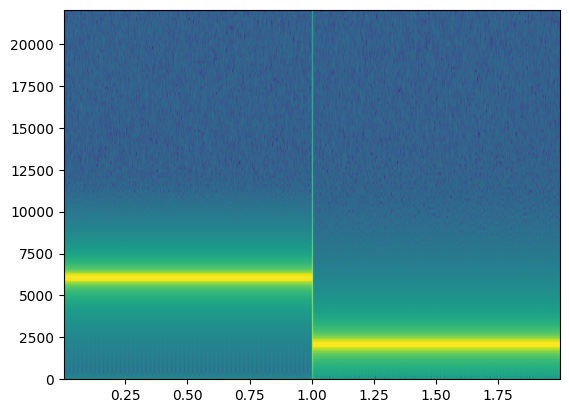

Audio a frecuencia de muestreo 11025
Tomando una de cada dos muestras: 


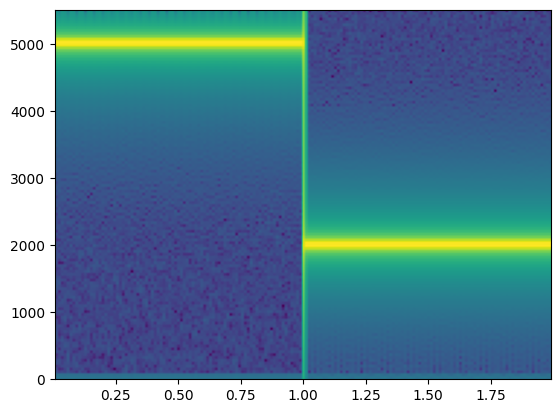

Usando decimate: 


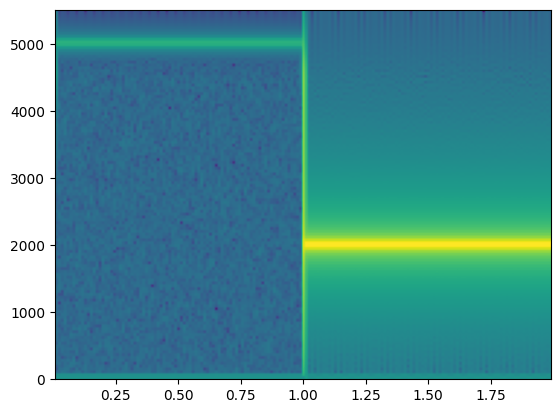

Audio a frecuencia de muestreo 22050
Tomando una de cada dos muestras: 


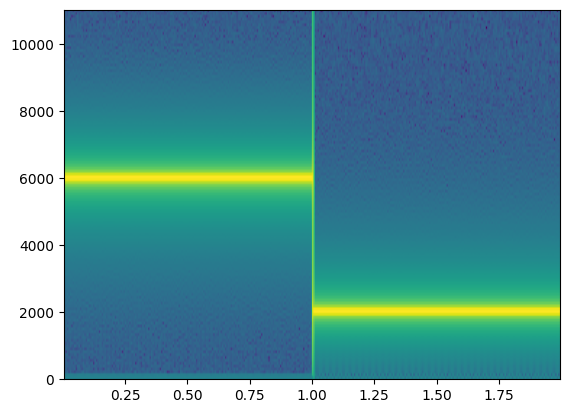

Usando decimate: 


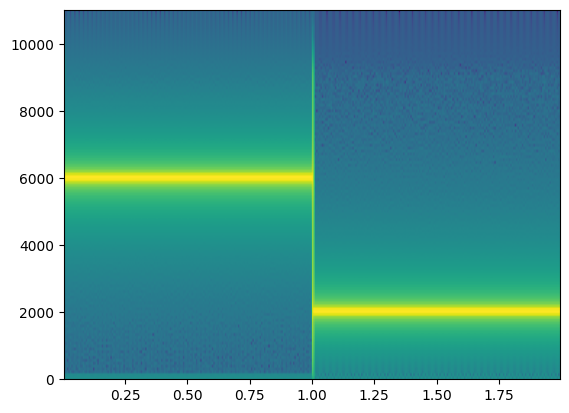

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import io, signal
from scipy.io.wavfile import read
from matplotlib.pyplot import specgram
from IPython.display import Audio
from scipy import signal

# Ejemplo de abrir y escuchar un archivo de audio
# deben adaptar el path al directorio donde se
# encuentran las pistas en su Drive.

## Descomentar línea de abajo en caso de usar Drive
# sr, data = io.wavfile.read('/content/drive/MyDrive/Colab Notebooks/AudioDSP_Files/tones.wav')

sr, data = io.wavfile.read(dir_files+'tones.wav')
print(f"Audio original a frecuencia de muestre {sr}")
display(Audio(data, rate=sr))
specgram(data, Fs=sr)
plt.show()
srs = [(11025, 4), (22050, 2)]
for sr, submuestreo in srs:
    print(f"Audio a frecuencia de muestreo {sr}")
    print(f"Tomando una de cada dos muestras: ")
    data_ds = data[::submuestreo]
    display(Audio(data_ds, rate=sr))
    specgram(data_ds, Fs=sr)
    plt.show()
    print(f"Usando decimate: ")
    data_ds = signal.decimate(data, q=submuestreo)
    display(Audio(data_ds, rate=sr))
    specgram(data_ds, Fs=sr)
    plt.show()




Audio original a frecuencia de muestre 44100


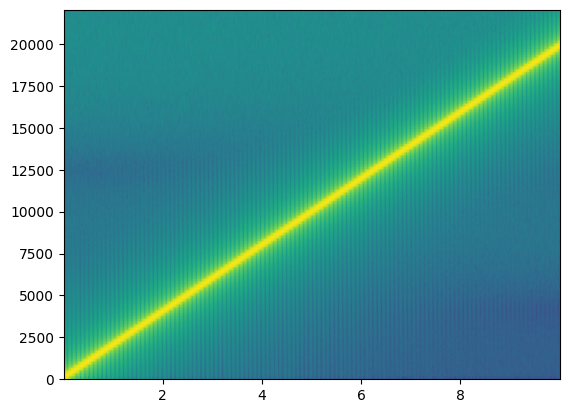

Audio a frecuencia de muestreo 11025
Tomando una de cada dos muestras: 


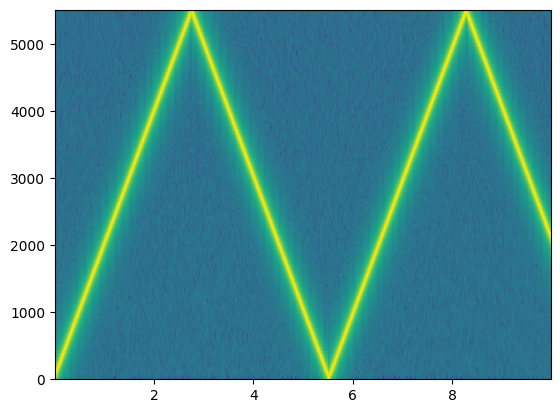

Usando decimate: 


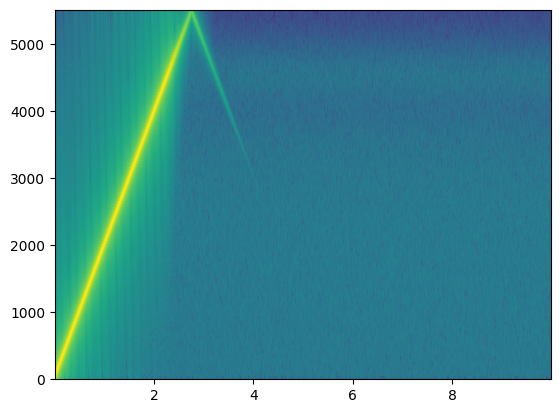

Audio a frecuencia de muestreo 22050
Tomando una de cada dos muestras: 


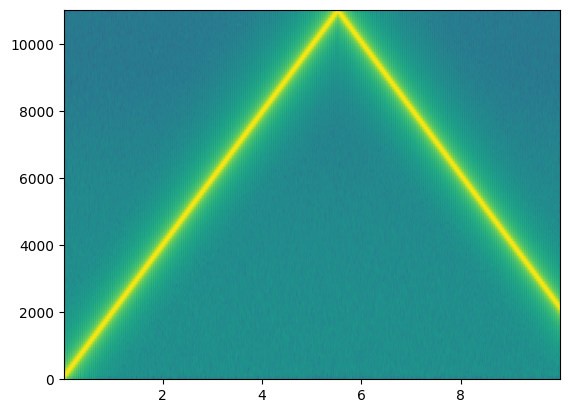

Usando decimate: 


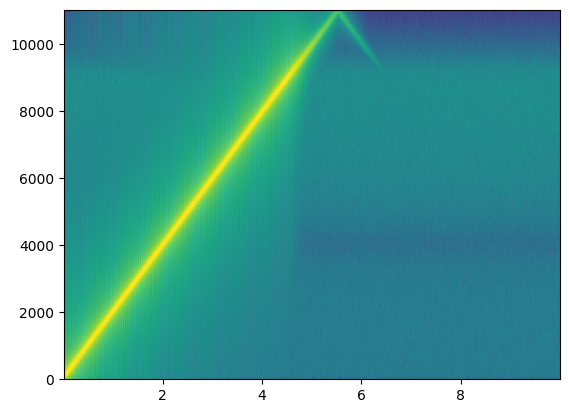

In [4]:
sr, data = io.wavfile.read(dir_files+'chirp.wav')
print(f"Audio original a frecuencia de muestre {sr}")
display(Audio(data, rate=sr))
specgram(data, Fs=sr)
plt.show()
srs = [(11025, 4), (22050, 2)]
for sr, submuestreo in srs:
    print(f"Audio a frecuencia de muestreo {sr}")
    print(f"Tomando una de cada dos muestras: ")
    data_ds = data[::submuestreo]
    display(Audio(data_ds, rate=sr))
    specgram(data_ds, Fs=sr)
    plt.show()
    print(f"Usando decimate: ")
    data_ds = signal.decimate(data, q=submuestreo)
    display(Audio(data_ds, rate=sr))
    specgram(data_ds, Fs=sr)
    plt.show()



### Parte 2 - Quantization / Dithering

1. Asumiendo el error de cuantización uniforme y con distribución $\mathcal{U}(-\frac{Q}{2},\frac{Q}{2})$, deduzca la expresión de la relación señal a ruido (*signal-to-error ratio*) para un sistema de $n$ bits de largo de palabra. ¿Cuántos decibeles se reduce el error de cuantización al aumentar $2$ bits el largo de palabra?
1. **Deducir la expresión de la potencia del ruido de cuantización** al agregar **_dithering de distribución triangular_** en el sistema. Considerar dithering con la distribucion de probabilidad de la figura 2.

_Nota_: las potencias del dithering de distribución rectangular y normal, representadas en la figura 2, son las siguientes respectivamente:
$$
\begin{cases}
			P_{D~unif} =\frac{Q^2}{12}\\
      P_{D~Gauss} =\frac{Q^2}{4}\\
\end{cases}
$$
---

<img src="./Archivos_P1/sine_n.jpeg" alt="FIG 1">

`FIG 1: Señal sinusoidal de frecuencia \unit[2000]{Hz} y amplitud $2$.`

---

---
<img src="./Archivos_P1/distribuciones_dither.jpeg" alt="FIG 2">

`FIG 2: Distribuciones de probabilidad de los tipos de dithering. La distribución gaussiana es`
$\mathcal{N}(0, \frac{Q^2}{4})$

---

3. Se desea analizar el efecto de la cuantización y el uso de dithering para una señal de baja amplitud. Se utilizará una señal sinusoidal de frecuencia $440Hz$ y amplitud $2$, muestreada a $f_s=44100Hz$ (figura 1). Para simular que esta señal tiene baja amplitud con respecto al rango de la cuantización, considerar el paso de cuantización igual a $1$.

	Se pide:
	1. Generar la señal sinusoidal (unos pocos segundos).
	1. Sumar a la señal tres tipos de dithering; uniforme, triangular y gaussiano, utilizando las distribuciones de probabilidad de la figura 2.
	1. Cuantizar la señal sin dithering, y las señales con los distintos tipos de dithering.
	1. Calcular la potencia del error de cuantización y graficar el espectro de la señal cuantizada en cada caso.
	1. Analizar los resultados de manera gráfica y perceptual (auditiva). Comparar.


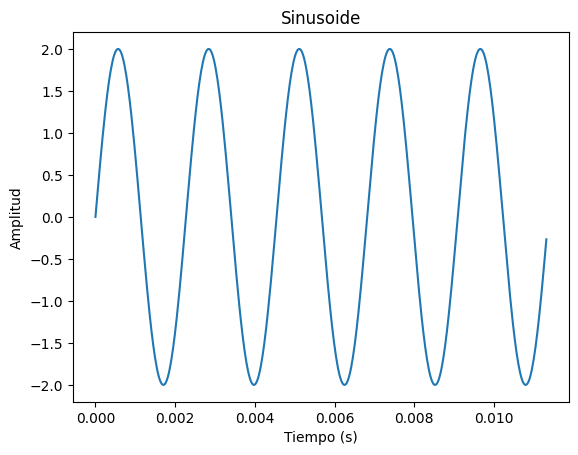

In [5]:
### 1) Generar señal sinusoidal

# parametros
amplitud = 2
frecuencia = 440

# vector de tiempos
t = np.arange(0, 3, 1/44100)
# otra opcion
t = np.linspace(0, 3, (3-0)*44100)
sinusoide = amplitud * np.sin(2*np.pi * frecuencia * t)

# grafica de parte de la sinusoide
plt.plot(t[:500], sinusoide[:500])
plt.title("Sinusoide")
plt.ylabel('Amplitud'), plt.xlabel('Tiempo (s)')

plt.show()

# reproducir audio
Audio(sinusoide, rate=44100)

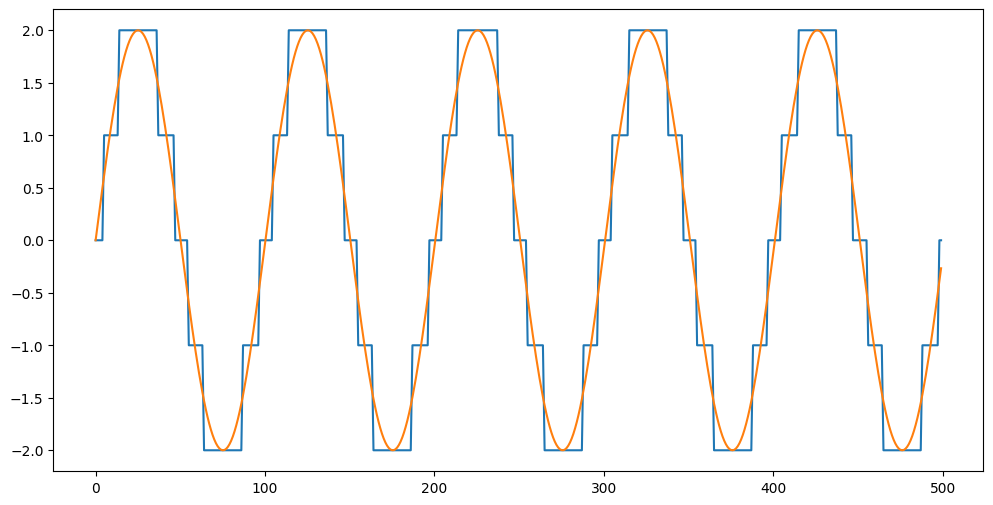

In [6]:
# 2. agergo los tipos de
Q = 1
sinusoide_dithering_uniforme = sinusoide + np.random.uniform(-Q/2, Q/2, len(sinusoide))
sinusoide_dithering_triangular = sinusoide + np.random.triangular(-Q, 0, Q, len(sinusoide))
sinusoide_dithering_gaussiano = sinusoide + np.random.normal(0, Q/2, len(sinusoide))

# 3. cuantizo las señales
def cuantizar(x, Q=1):
    return np.round(x / Q) * Q

sinusoide_cuantizada = cuantizar(sinusoide)
# ploteo
plt.figure(figsize=(12, 6))
plt.plot(sinusoide_cuantizada[:500])
plt.plot(sinusoide[:500])

plt.show()




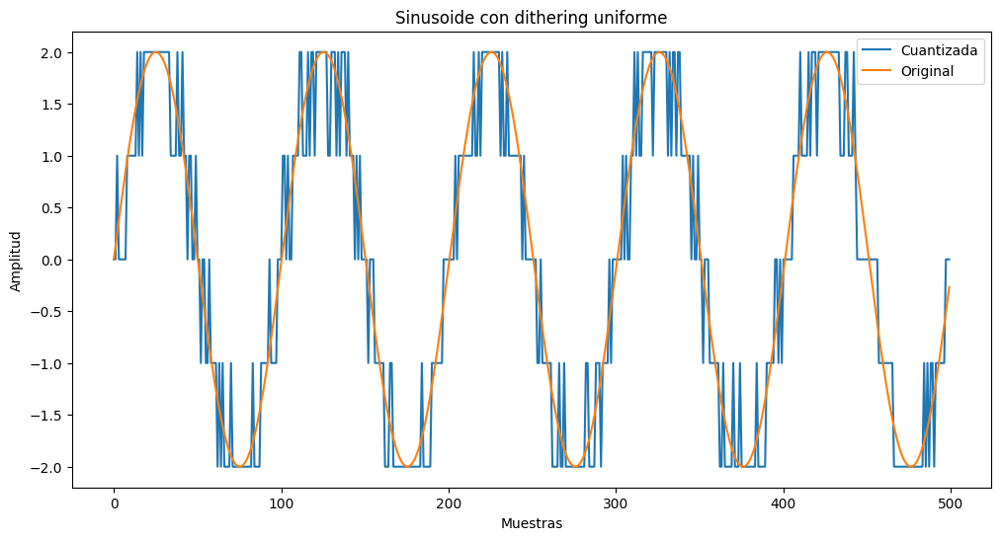

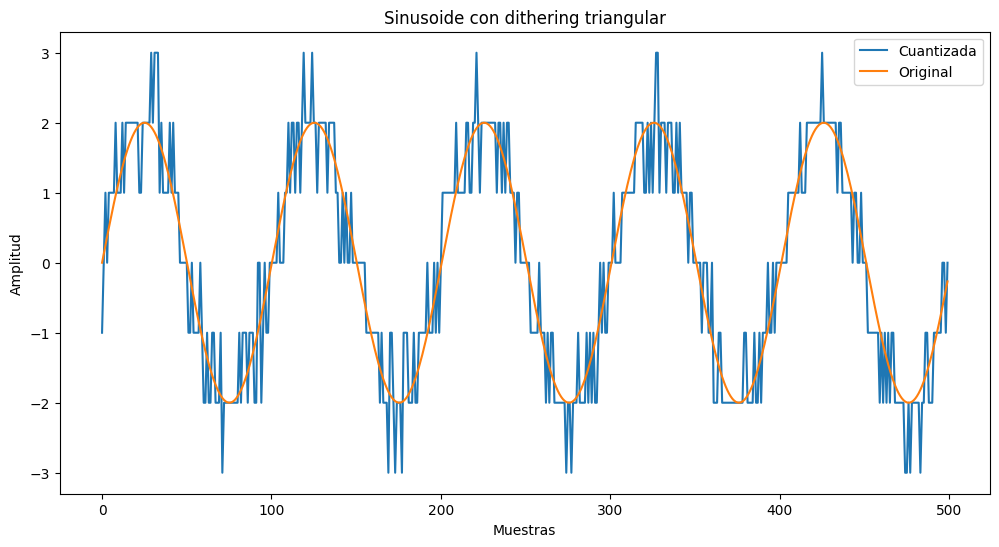

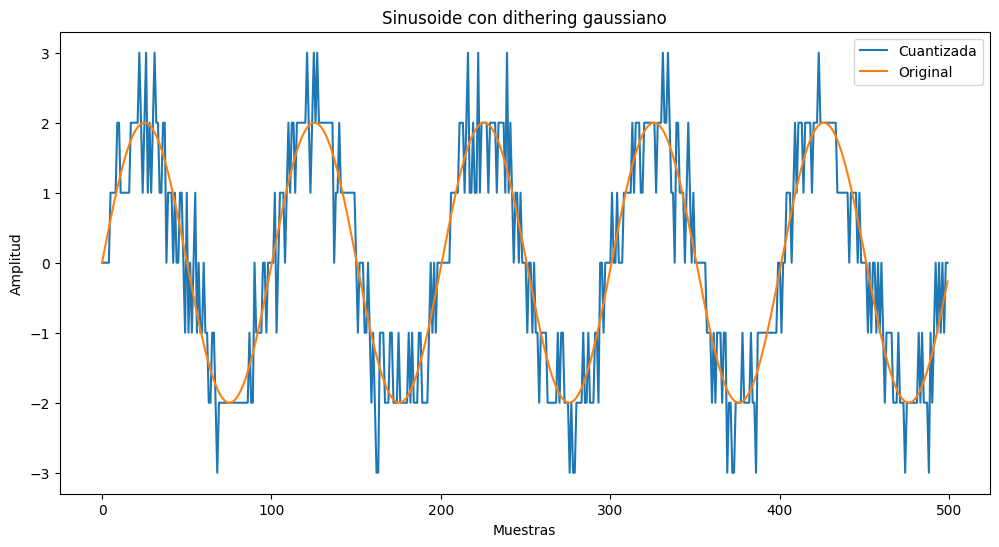

Potencia del error de cuantización (Sin dithering): 0.069504
Potencia del error de cuantización en dB (Sin dithering): -11.58 dB
Potencia del error de cuantización (Dithering uniforme): 0.144807
Potencia del error de cuantización en dB (Dithering uniforme): -8.39 dB
Potencia del error de cuantización (Dithering triangular): 0.249236
Potencia del error de cuantización en dB (Dithering triangular): -6.03 dB
Potencia del error de cuantización (Dithering gaussiano): 0.330717
Potencia del error de cuantización en dB (Dithering gaussiano): -4.81 dB


/var/folders/fk/tpjf6x6n53j51fl8_5xzgm9c0000gn/T/ipykernel_19753/3691397162.py:43: RuntimeWarning: divide by zero encountered in log10
  plt.plot(freqs[:len(freqs)//2], 20 * np.log10(np.abs(fft[:len(fft)//2])))


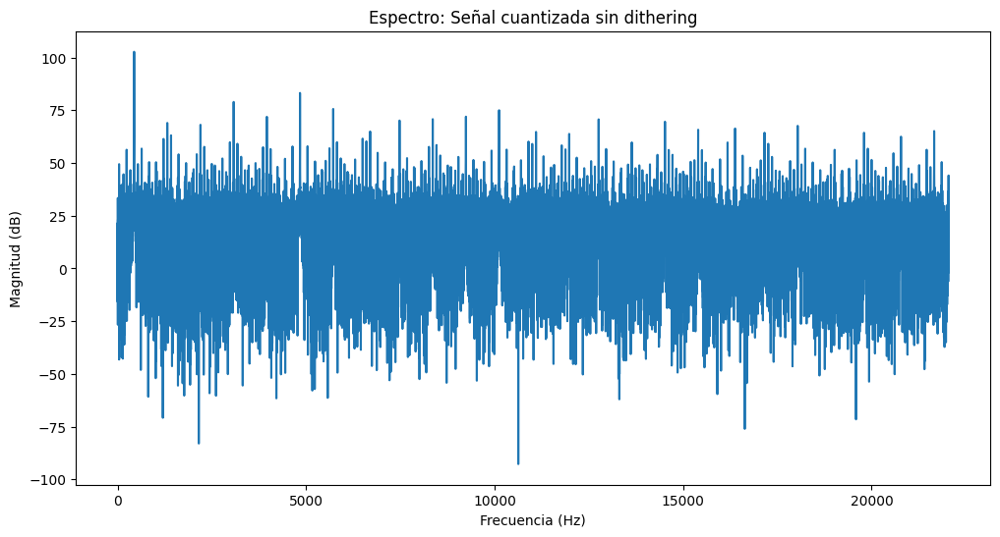

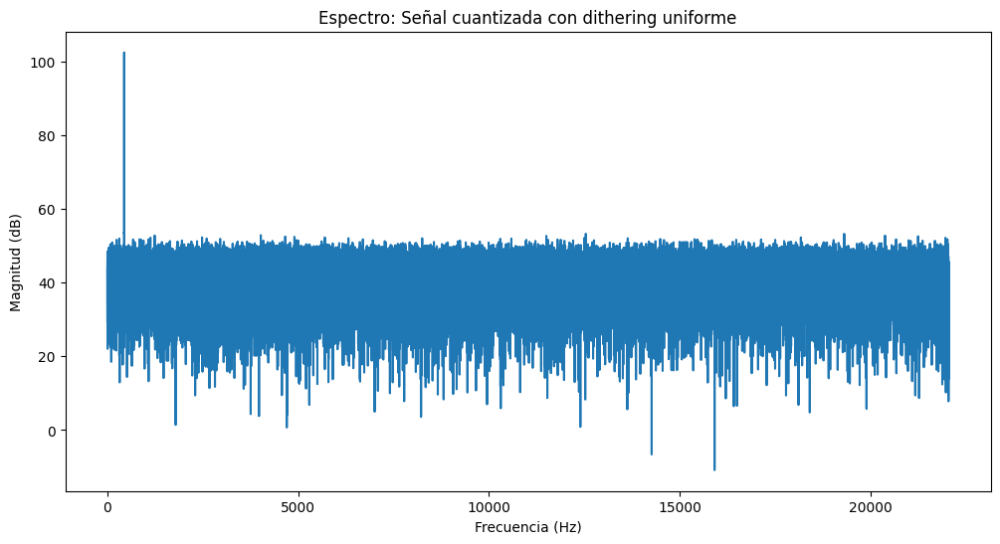

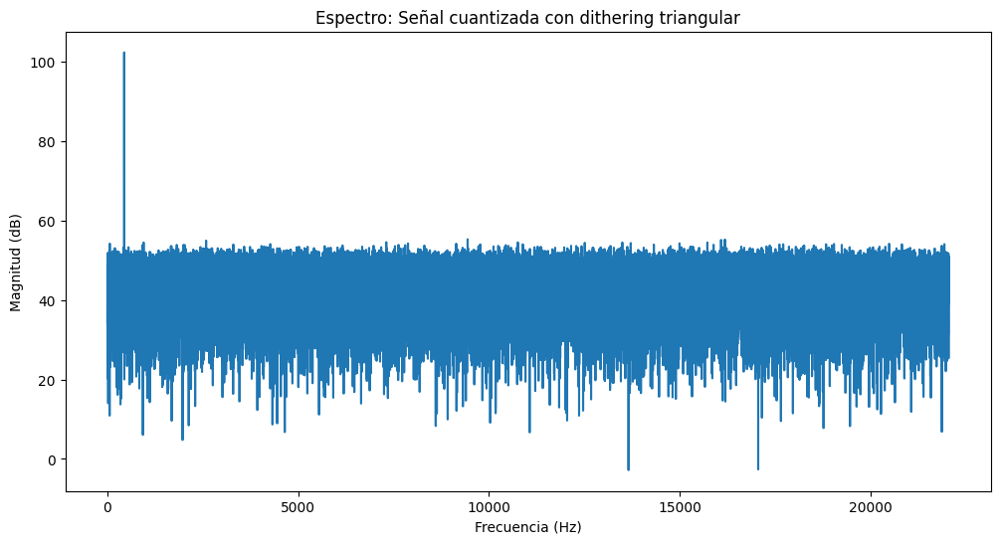

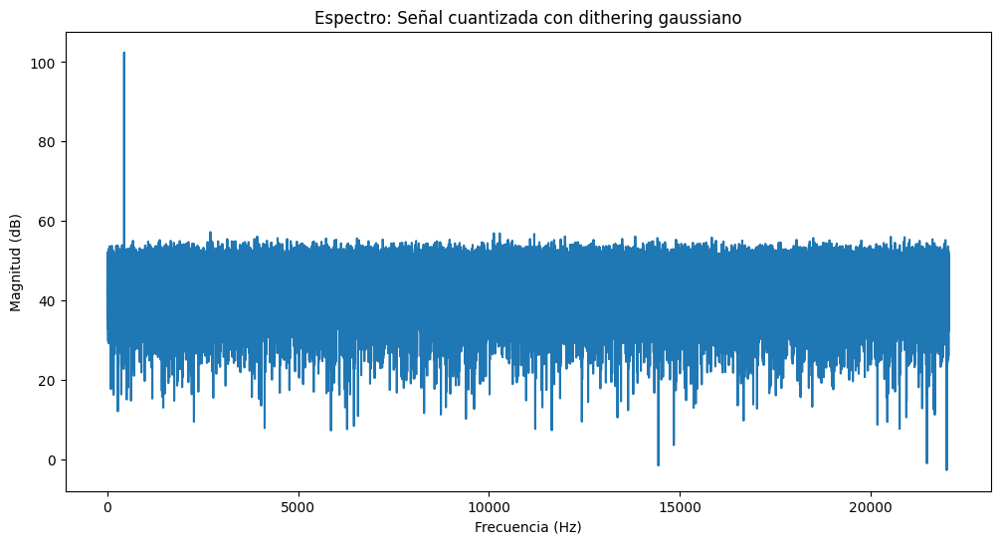

Reproducción de audio para análisis perceptual:


In [7]:
# Cuantización de señales con diferentes tipos de dithering
sinusoide_dithering_uniforme_cuantizada = cuantizar(sinusoide_dithering_uniforme)
sinusoide_dithering_triangular_cuantizada = cuantizar(sinusoide_dithering_triangular)
sinusoide_dithering_gaussiano_cuantizada = cuantizar(sinusoide_dithering_gaussiano)

# Función para plotear señales
def plot_signal(signal, original, title):
    plt.figure(figsize=(12, 6))
    plt.plot(signal[:500], label='Cuantizada')
    plt.plot(original[:500], label='Original')
    plt.title(title)
    plt.legend()
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud')
    plt.show()

# Ploteo de señales cuantizadas
plot_signal(sinusoide_dithering_uniforme_cuantizada, sinusoide, "Sinusoide con dithering uniforme")
plot_signal(sinusoide_dithering_triangular_cuantizada, sinusoide, "Sinusoide con dithering triangular")
plot_signal(sinusoide_dithering_gaussiano_cuantizada, sinusoide, "Sinusoide con dithering gaussiano")

# Cálculo de la potencia del error de cuantización
def calcular_potencia_error(original, cuantizada):
    return np.var(original - cuantizada)

potencias_error = {
    'Sin dithering': calcular_potencia_error(sinusoide, sinusoide_cuantizada),
    'Dithering uniforme': calcular_potencia_error(sinusoide, sinusoide_dithering_uniforme_cuantizada),
    'Dithering triangular': calcular_potencia_error(sinusoide, sinusoide_dithering_triangular_cuantizada),
    'Dithering gaussiano': calcular_potencia_error(sinusoide, sinusoide_dithering_gaussiano_cuantizada)
}

# Impresión de resultados
for tipo, potencia in potencias_error.items():
    print(f"Potencia del error de cuantización ({tipo}): {potencia:.6f}")
    print(f"Potencia del error de cuantización en dB ({tipo}): {10 * np.log10(potencia):.2f} dB")

# Función para plotear el espectro
def plot_espectro(signal, title):
    plt.figure(figsize=(12, 6))
    fft = np.fft.fft(signal)
    freqs = np.fft.fftfreq(len(signal), 1/44100)
    plt.plot(freqs[:len(freqs)//2], 20 * np.log10(np.abs(fft[:len(fft)//2])))
    plt.title(f"Espectro: {title}")
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Magnitud (dB)')
    plt.show()

# Ploteo de espectros
plot_espectro(sinusoide_cuantizada, "Señal cuantizada sin dithering")
plot_espectro(sinusoide_dithering_uniforme_cuantizada, "Señal cuantizada con dithering uniforme")
plot_espectro(sinusoide_dithering_triangular_cuantizada, "Señal cuantizada con dithering triangular")
plot_espectro(sinusoide_dithering_gaussiano_cuantizada, "Señal cuantizada con dithering gaussiano")

# Reproducción de audio para análisis perceptual
print("Reproducción de audio para análisis perceptual:")
display(Audio(sinusoide_cuantizada, rate=44100, autoplay=False))
display(Audio(sinusoide_dithering_uniforme_cuantizada, rate=44100, autoplay=False))
display(Audio(sinusoide_dithering_triangular_cuantizada, rate=44100, autoplay=False))
display(Audio(sinusoide_dithering_gaussiano_cuantizada, rate=44100, autoplay=False))

4. **Implementar y aplicar** técnica de **_noise-shaping_**, vista en el teórico del curso, _para el caso con dither triangular_.
* Comparar el resultado tanto gráficamente (en dominio temporal y frecuencial) y en percepción auditiva con los casos sin dither y con dither.
* _Responder:_ ¿Qué particularidad tiene el espectro resultante al usar noise-shaping?

/var/folders/fk/tpjf6x6n53j51fl8_5xzgm9c0000gn/T/ipykernel_19753/3094109943.py:19: RuntimeWarning: divide by zero encountered in log
  plt.plot(freqs[:len(freqs)//2], np.log(np.abs(fft)[:len(fft)//2]))


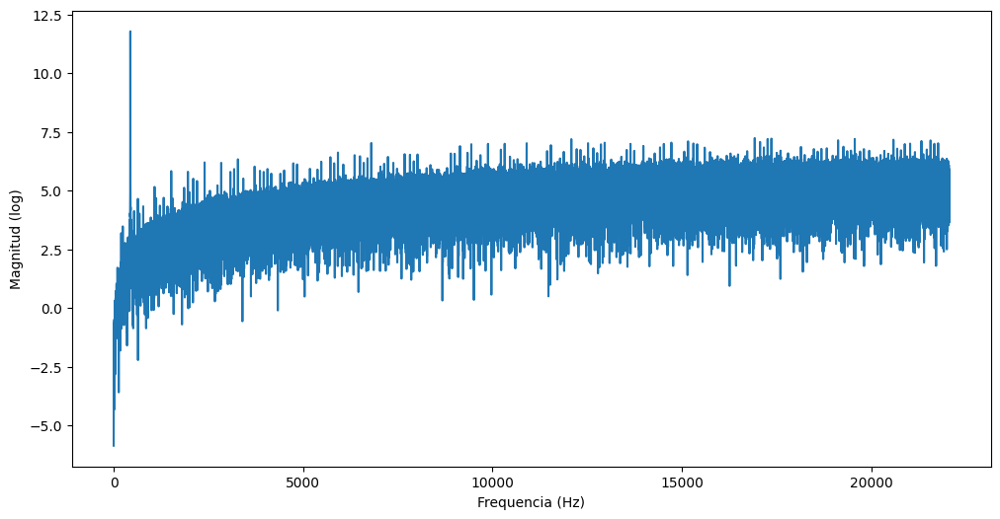

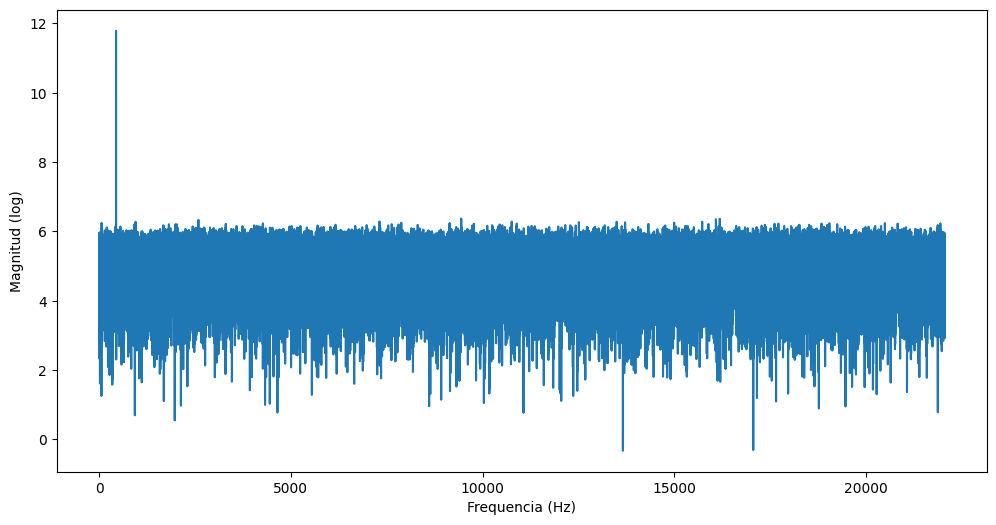

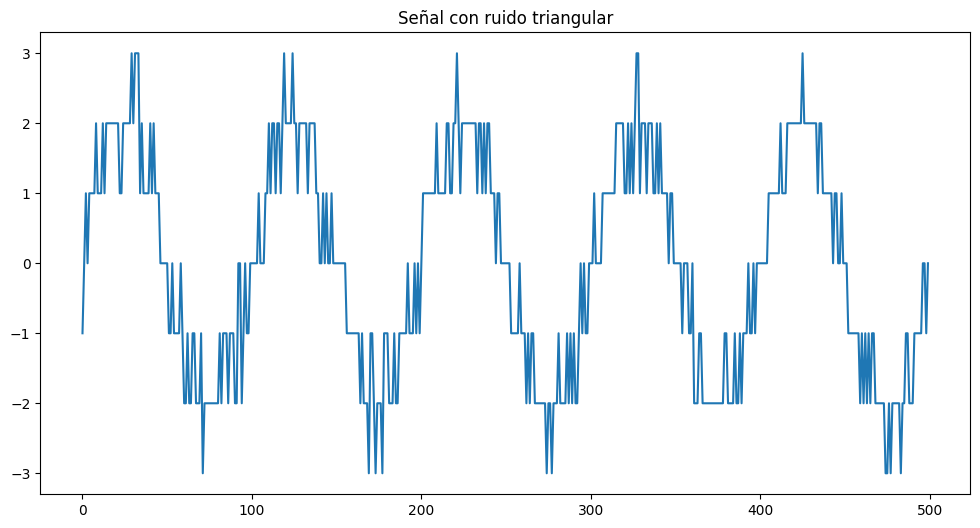

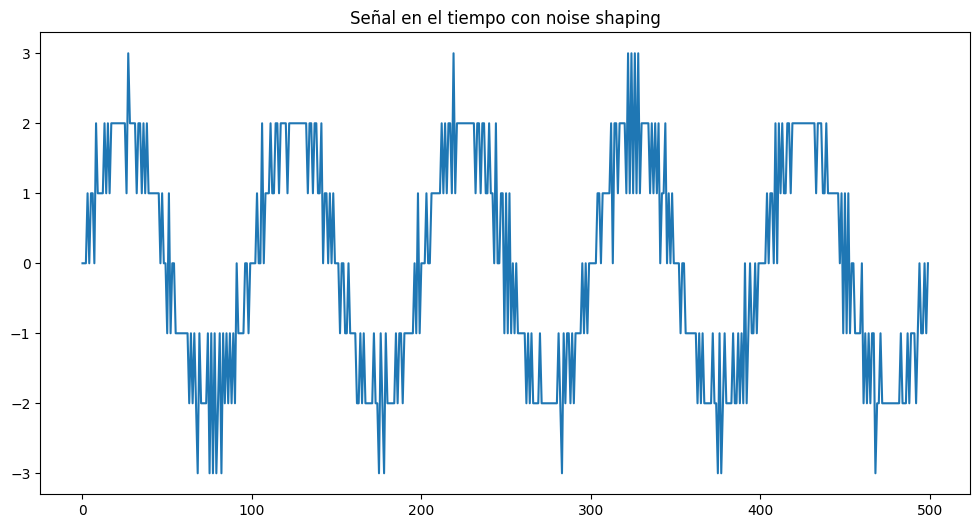

In [8]:
# Implementación de noise-shaping con dither triangular
def noise_shaping(signal, bits):
    y = np.zeros(len(signal))
    e = np.zeros(len(signal))
    dither = np.random.triangular(-0.5, 0, 0.5, len(signal))

    for i in range(len(signal)):
        # Aplicar dither y error del paso anterior
        input_signal = signal[i] + dither[i] - e[i-1] if i > 0 else signal[i] + dither[i]

        # Cuantización
        y[i] = cuantizar(input_signal, bits)

        # Cálculo del error
        e[i] = y[i] - signal[i]

    return y

# Aplicar noise-shaping
bits = 8  # Ajustar según sea necesario
sinusoide_noise_shaped = noise_shaping(sinusoide, bits)

# Función para plotear espectro mejorada
def plot_espectro_mejorado(signal, title, fs=44100):
    plt.figure(figsize=(12, 6))
    fft = np.fft.fft(signal)
    freqs = np.fft.fftfreq(len(signal), 1/fs)
    plt.semilogx(freqs[:len(freqs)//2], 20 * np.log10(np.abs(fft[:len(fft)//2])))
    plt.title(f"Espectro: {title}")
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Magnitud (dB)')
    plt.grid(True)
    plt.xlim(20, fs/2)  # Limitar el eje x a frecuencias audibles
    plt.show()

# Comparación de espectros
plot_espectro_mejorado(sinusoide_cuantizada, "Señal cuantizada sin dither")
plot_espectro_mejorado(sinusoide_dithering_triangular_cuantizada, "Señal con dither triangular")
plot_espectro_mejorado(sinusoide_noise_shaped, "Señal con noise-shaping")

# Comparación en el dominio del tiempo
plt.figure(figsize=(12, 6))
plt.plot(sinusoide[:500], label='Original')
plt.plot(sinusoide_cuantizada[:500], label='Cuantizada sin dither')
plt.plot(sinusoide_dithering_triangular_cuantizada[:500], label='Dither triangular')
plt.plot(sinusoide_noise_shaped[:500], label='Noise-shaped')
plt.title("Comparación de señales en el dominio del tiempo")
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)
plt.show()

# Reproducción de audio para análisis perceptual
print("Reproducción de audio para análisis perceptual:")
display(Audio(sinusoide_cuantizada, rate=44100, autoplay=False))
display(Audio(sinusoide_dithering_triangular_cuantizada, rate=44100, autoplay=False))
display(Audio(sinusoide_noise_shaped, rate=44100, autoplay=False))

# Cálculo y comparación de SNR
def calcular_snr(original, procesada):
    noise = original - procesada
    return 10 * np.log10(np.sum(original**2) / np.sum(noise**2))

snr_cuantizada = calcular_snr(sinusoide, sinusoide_cuantizada)
snr_dither = calcular_snr(sinusoide, sinusoide_dithering_triangular_cuantizada)
snr_noise_shaped = calcular_snr(sinusoide, sinusoide_noise_shaped)

print(f"SNR Cuantizada sin dither: {snr_cuantizada:.2f} dB")
print(f"SNR Dither triangular: {snr_dither:.2f} dB")
print(f"SNR Noise-shaped: {snr_noise_shaped:.2f} dB")

## Ejercicio 2
**Short-time average energy, magnitude and zero-crossing rate.**

En este ejercicio se calculan características en tiempo corto de una señal de audio; en particular, energía, magnitud y tasa de cruces por cero.

### Parte 1

La energía y la magnitud en tiempo corto de una señal $x[n]$, $E_n$ y $M_n$ respectivamente, se definen como:

$$
\begin{equation*}
\begin{array}{rcl}
	E_n & = & \displaystyle\sum_{m=-\infty}^{\infty}x^2[m]w[n-m] \\
	M_n & = & \displaystyle\sum_{m=-\infty}^{\infty}|x[m]|w[n-m]
\end{array}
\end{equation*}
$$
donde $w[n]$ es una ventana de análisis temporal. Se pide:

1. Para la ventana $w_a[n]$, encontrar las expresiones en recurrencia para calcular $E_n$ y $M_n$ en función de $E_{n-1}$ y $M_{n-1}$ respectivamente.

$$
	\begin{equation*}
		w_a[n]=
			\begin{cases}
				a^n, & n \geq 0 \\
				0, & n < 0.
		\end{cases}
	\end{equation*}
	$$

2. Para la ventana rectangular $w_R[n]$, escribir funciones que implementen el cálculo de $E_n$ y $M_n$.

$$
	\begin{equation*}
		w_R[n]=
			\begin{cases}
				1, & 0 \leq n \leq N-1 \\
				0, & \text{en otro caso}.
			\end{cases}
	\end{equation*}
$$
3. Utilizando estas funciones, calcular y graficar $E_n$ y $M_n$ para la señal de audio del archivo _ejemplo_palabras.wav_. ¿Es posible determinar el inicio y final de las palabras aisladas utilizando estas medidas?

$$ E_n = a E_{n-1} + x^2[n], \quad M_n = a M_{n-1} + |x[n]|$$

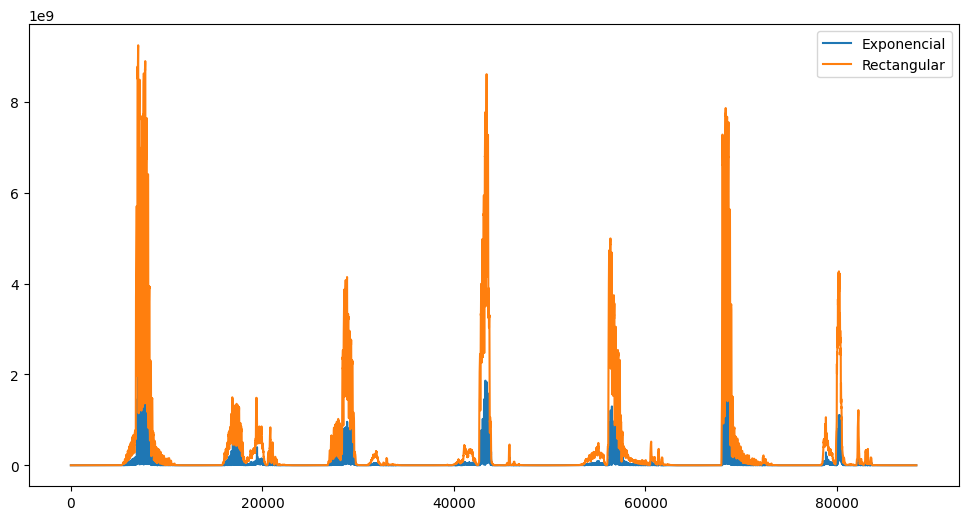

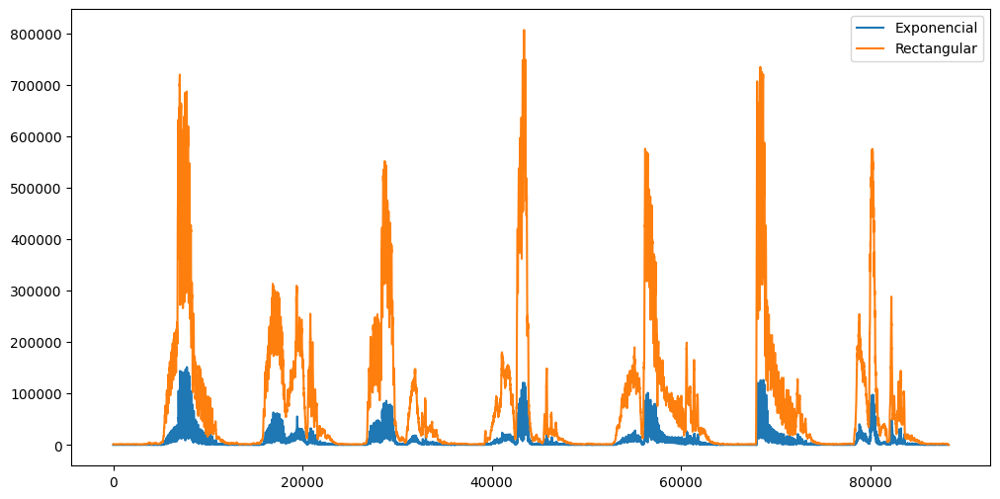

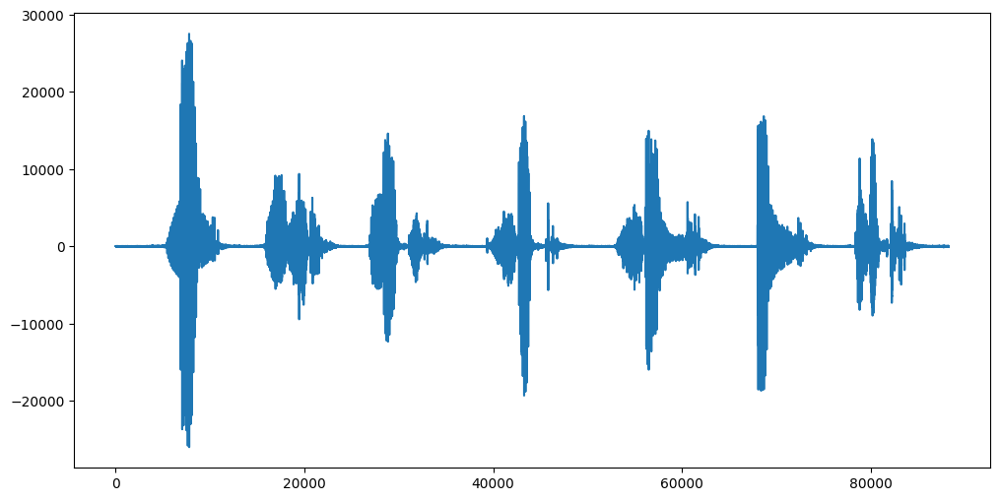

In [9]:
sr, data = io.wavfile.read(dir_files+'ejemplo_palabras.wav')
Audio(data, rate=sr)

# 1.
def energia_a(x, a):
    E = np.zeros(len(x))
    for i in range(len(x)):
        E[i] = a * E[i-1] + float(x[i])**2
        if E[i] < 0:
            # overflow
            print(f"E[i] {i} es negativo: {E[i]}, x[i]: {x[i]}, E[i-1]: {E[i-1]}")
    return E

def magnitud_a(x, a):
    M = np.zeros(len(x))
    for i in range(len(x)):
        M[i] = a * M[i-1] + np.abs(float(x[i]))
        if M[i] < 0:
            print(f"M[i] {i} es negativo: {M[i]}, x[i]: {x[i]}, M[i-1]: {M[i-1]}")
    return M

# 2.
def energia_r(x, N):
    E = np.zeros(len(x))
    for i in range(len(x)):
        E[i] = np.sum((x[i:i+N].astype(float)**2))
        if E[i] < 0:
            print(f"E[i] {i} es negativo: {E[i]}, x[i:i+N]: {x[i:i+N]}")
    return E

def magnitud_r(x, N):
    M = np.zeros(len(x))
    for i in range(len(x)):
        M[i] = np.sum(np.abs(x[i:i+N].astype(float)))
        if M[i] < 0:
            print(f"M[i] {i} es negativo: {M[i]}, x[i:i+N]: {x[i:i+N]}")
    return M


E_a = energia_a(data, 0.9)
M_a = magnitud_a(data, 0.9)

E_r = energia_r(data, 100)
M_r = magnitud_r(data, 100)

plt.figure(figsize=(12, 6))
plt.plot(E_a, label='Exponencial')
plt.plot(E_r, label='Rectangular')
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(M_a, label='Exponencial')
plt.plot(M_r, label='Rectangular')
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(data)
plt.show()

display(Audio(data, rate=sr))


### Parte 2

La tasa de cruces por cero es una forma simple de estimar el contenido espectral de una señal, sobre todo para señales de banda angosta. Matemáticamente puede definirse como

\begin{equation*}
	Z_n = \displaystyle\sum_{m=-\infty}^{\infty}|\text{sign}(x[m])-\text{sign}(x[m-1])|\ w[n-m]
\end{equation*}

donde \;
$\text{sign}(x[m]) = \begin{cases} 1, & x[m]\geq0 \\ -1, & x[m]<0. \end{cases}$ \;
y \;
$w[n] = \begin{cases} \frac{1}{2N}, & 0\leq n\leq N-1 \\ 0, & \text{en otro caso} \end{cases}$

Se pide:
1. Demostrar que $Z_n$ puede expresarse de forma recursiva como

  \begin{equation*}
        Z_n = Z_{n-1} + \frac{1}{2N}\left\{ |\text{sign}(x[n]) - \text{sign}(x[n-1])| - |\text{sign}(x[n-N]) - \text{sign}(x[n-N-1])| \right\}.
  \end{equation*}
  _Sugerencia:_ Calcular la diferencia $Z_n - Z_{n-1}$ para llegar a la expresión deseada.

2. Implementar una función que calcule la tasa de cruces por cero para $N$ muestras de una señal.

3. Calcular y graficar la tasa de cruces por cero para la señal de audio del archivo *ejemplo_palabras.wav*, cada $10ms$. ¿Esta medida aporta información para encontrar los inicios y finales de las palabras?

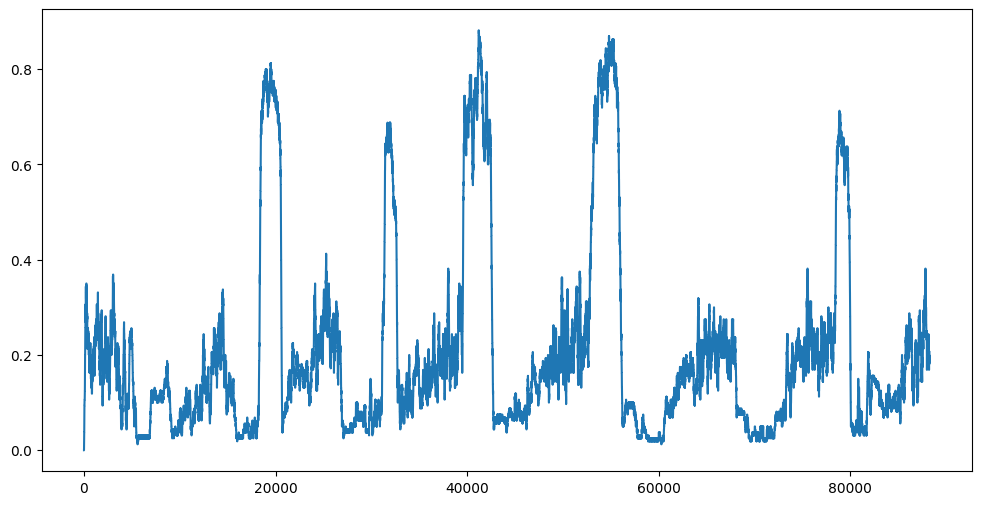

In [10]:
def tasa_cruce_cero(x, N):
    largo = x.shape[0]
    signos = np.sign(x)
    diferencias = np.abs(np.diff(signos))
    T = np.zeros(largo)
    suma_acumulativa = np.cumsum(diferencias)
    T[N:] = (suma_acumulativa[N-1:] - suma_acumulativa[:-N+1]) / (2*N)
    for n in range(N):
        T[n] = np.sum(diferencias[:n]) / (2*N)

    return T

Z = tasa_cruce_cero(data, np.round(10e-3 * sr).astype(int))

plt.figure(figsize=(12, 6))
plt.plot(Z)

### Parte 3

El problema de encontrar el inicio y final de palabras es importante en muchas aplicaciones de procesamiento de señales de voz. Una manera simple de abordar este problema es utilizando la energía en tiempo corto y la tasa de cruces por cero en tiempo corto.

Se pide:

1. Implementar un algoritmo que encuentre automáticamente el inicio y final de las palabras, utilizando las funciones escritas en las partes anteriores (energía y tasa de cruces por cero).
1. Probar el algoritmo con las señales de los archivos *ejemplo_palabras.wav*, *voice2.wav* y *fox.wav*.
1. Comentar los resultados obtenidos, incluyendo las posibles limitantes del abordaje.

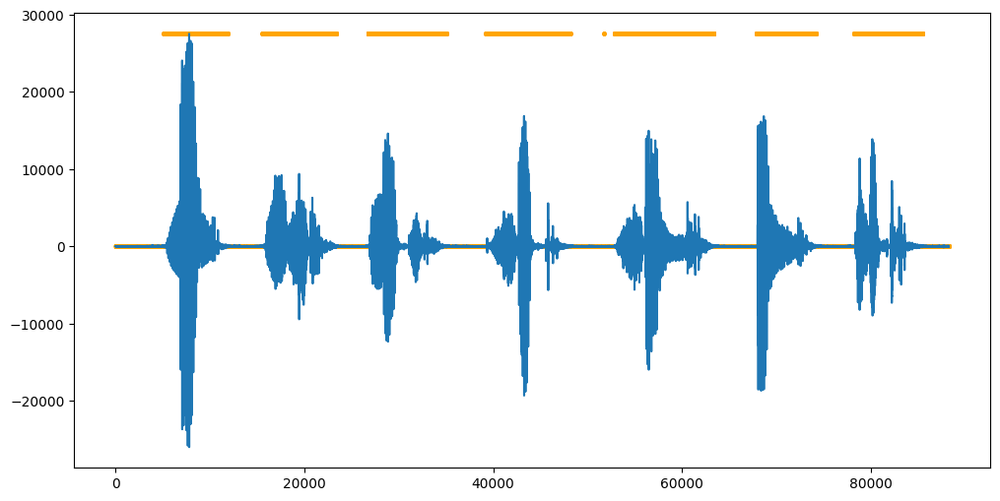

In [11]:
def detector_palabras(x, N, threshold_energia, threshold_cruce_cero):
    hay_palabra = []
    E = energia_r(x, N)
    Z = tasa_cruce_cero(x, N)
    for i in range(len(x)):
        hay_palabra.append(E[i] > threshold_energia or Z[i] > threshold_cruce_cero)
    return hay_palabra


sr,data = io.wavfile.read(dir_files+'ejemplo_palabras.wav')
palabras = detector_palabras(data, 100, 3.5e5, 0.5)
# plot de inicios y finales
plt.figure(figsize=(12, 6))
plt.plot(np.arange(len(data)), data)
# plot donde estan las palabras
plt.scatter(np.arange(len(palabras)), np.array(palabras, dtype=int) * np.max(data), color='orange', s=5)
plt.show()

display(Audio(data, rate=sr))

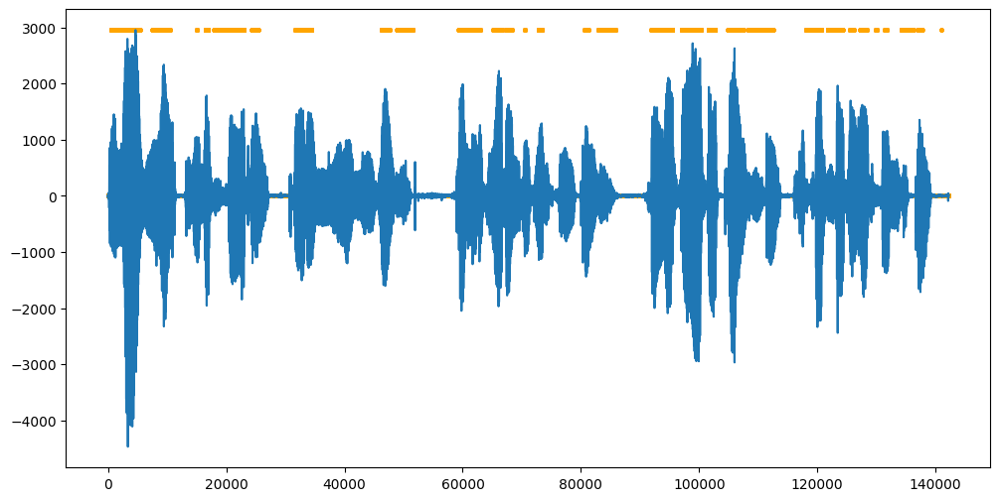

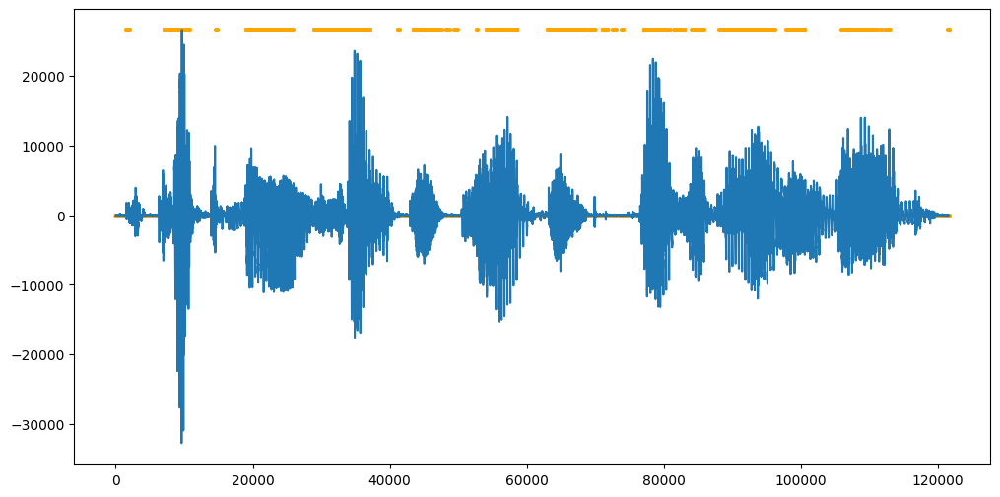

In [12]:
# mismo para voice2.wav
sr, data = io.wavfile.read(dir_files+'voice2.wav')

energia = energia_r(data, 100)
cruce_cero = tasa_cruce_cero(data, 100)

palabras = detector_palabras(data, 100, 0.25e8, 0.5)
# plot de inicios y finales
plt.figure(figsize=(12, 6))
plt.plot(np.arange(len(data)), data)
# plot donde estan las palabras
plt.scatter(np.arange(len(palabras)), np.array(palabras, dtype=int) * np.max(data), color='orange', s=5)
plt.show()

display(Audio(data, rate=sr))

# mismo para fox.wav
sr, data = io.wavfile.read(dir_files+'fox.wav')

energia = energia_r(data, 100)
cruce_cero = tasa_cruce_cero(data, 100)


palabras = detector_palabras(data, 100, 0.25e10, 0.2)
# plot de inicios y finales
plt.figure(figsize=(12, 6))
plt.plot(np.arange(len(data)), data)
# plot donde estan las palabras
plt.scatter(np.arange(len(palabras)), np.array(palabras, dtype=int) * np.max(data), color='orange', s=5)
plt.show()

display(Audio(data, rate=sr))

## Ejercicio 3
**Short-time autocorrelation function, short-time AMDF and pitch estimation.**

En este ejercicio se presenta el cálculo de la función de autocorrelación, y su aplicación en el cálculo de la frecuencia fundamental de una señal de audio.

### Parte 1

La función de autocorrelación en tiempo corto está definida como
\begin{equation*}
	R_n[k] = \displaystyle\sum_{m=-\infty}^{\infty}x[m]w[n-m]x[m+k]w[n-k-m].
\end{equation*}

1. Demostrar que $R_n[k]$ es una función par en $k$, o sea, que $R_n[k] = R_n[-k]$.
1. Demostrar que $R_n[k]$ puede escribirse como
$$
	\begin{equation*}
		R_n[k] = \displaystyle\sum_{m=-\infty}^{\infty}x[m]x[m-k]h_k[n-m]
	\end{equation*}
$$
donde $h_k[n] = w[n]w[n+k]$.


### Parte 2

Se utilizará ahora la función de autocorrelación para implementar la detección de frecuencia fundamental de señales de audio. Se sugiere el siguiente procedimiento:
1. Se toman intervalos de $30ms$ de largo, cada $10ms$ (i.e. $20ms$ de superposición).
1. Para cada intervalo:
	1. Se calculan los primeros $250$ valores de la función de autocorrelación (Se sugiere una implementación vectorial).
	1. Se busca el índice $k_f$ del primer máximo local que supere el $60\%$ del valor en cero. Si existe, hay un componente periódico suficientemente notorio, cuya frecuencia es $f = \frac{f_s}{k_f}$.
	1. Si no se encuentra ningún máximo local bajo esa condición, se asigna $f = 0$, considerándose que no hay un componente periódico relevante en ese intervalo de tiempo.
	1. Se obtiene un vector con valores de frecuencia cada $10ms$ comenzando en $t=0.015s$.

Realizar este procedimiento utilizando la señal de audio del archivo *LP-mem-6-a.wav*. Comparar los resultados con la referencia contenida en el archivo *LP-mem-6-a.txt*.

_Sugerencia:_ puede ser de utilidad un post-procesado de la frecuencia fundamental obtenida para suavizar y/o eliminar detecciones espúreas.



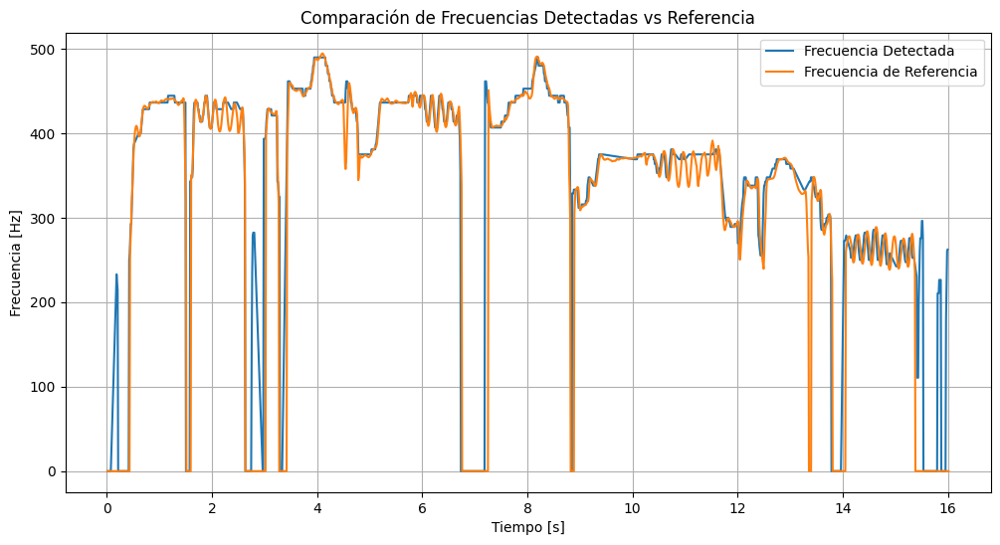

In [13]:

def autocorrelacion(segmento_senal, tamano):
    n = len(segmento_senal)
    corr = np.zeros(tamano, dtype=float)
    for k in range(tamano):
        corr[k] = np.sum(segmento_senal[:n-k].astype(float) * segmento_senal[k:].astype(float))
    return corr[:tamano]

def es_maximo_local(autocorr, i):
    if i == 0 or i >= len(autocorr) - 1:
        return False
    return autocorr[i] > autocorr[i-1] and autocorr[i] > autocorr[i+1]

def filtro_mediana(frecuencias, tamano_ventana=7):
    frecuencias_filtradas = np.copy(frecuencias)
    for i in range(len(frecuencias)):
        inicio = max(0, i - tamano_ventana // 2)
        fin = min(len(frecuencias), i + tamano_ventana // 2 + 1)
        frecuencias_filtradas[i] = np.median(frecuencias[inicio:fin])
    return frecuencias_filtradas


def remover_anomalias(frecuencias, umbral=500):
    frecuencias_filtradas = np.copy(frecuencias)
    for i in range(len(frecuencias)):
        if frecuencias[i] > umbral:
            frecuencias_filtradas[i] = -1

    # Interpolar todos los -1
    indices_validos = np.where(frecuencias_filtradas != -1)[0]
    indices_a_interpolar = np.where(frecuencias_filtradas == -1)[0]

    if len(indices_validos) > 0:
        frecuencias_filtradas[indices_a_interpolar] = np.interp(
            indices_a_interpolar,
            indices_validos,
            frecuencias_filtradas[indices_validos]
        )
    else:
        # Si no hay valores válidos, asignar 0 a todos los -1
        frecuencias_filtradas[indices_a_interpolar] = 0

    return frecuencias_filtradas

def detectar_frecuencia_fundamental(senal, fs, tamano_ventana, tamano_salto, longitud_autocorr, umbral):
    num_ventanas = (len(senal) - tamano_ventana) // tamano_salto + 1
    frecuencias = []

    for i in range(num_ventanas):
        inicio = i * tamano_salto
        ventana = senal[inicio:inicio + tamano_ventana].astype(float)

        autocorr = autocorrelacion(ventana, tamano=longitud_autocorr)[:longitud_autocorr]
        r0 = autocorr[0]
        f = 0.0
        for k_f in range(1, len(autocorr)):
            if es_maximo_local(autocorr, k_f) and autocorr[k_f] > umbral * r0:

                f = fs / float(k_f)
                break

        frecuencias.append(f)

    return np.array(frecuencias, dtype=float)

sr, senal = io.wavfile.read(dir_files+'LP-mem-6-a.wav')
display(Audio(senal.astype(float), rate=sr))

tamano_ventana = int(0.03 * sr)
tamano_salto = int(0.01 * sr)
longitud_autocorr = 250
umbral = 0.6

frecuencias = detectar_frecuencia_fundamental(senal.astype(float), float(sr), tamano_ventana, tamano_salto, longitud_autocorr, umbral)

frecuencias_fundamentales_reales = np.loadtxt(dir_files+'LP-mem-6-a.txt', dtype=float)

tiempo_ref = frecuencias_fundamentales_reales[:, 0]
valores_ref = frecuencias_fundamentales_reales[:, 1]

frecuencias_suavizadas = filtro_mediana(frecuencias)
# frecuencias_suavizadas = remover_detecciones_espurias(frecuencias_suavizadas)
frecuencias_suavizadas = remover_anomalias(frecuencias_suavizadas)
tamano_ventana = 5

eje_tiempo = np.arange(len(frecuencias), dtype=float) * (float(tamano_salto) / float(sr)) + 0.015





plt.figure(figsize=(12, 6))
plt.plot(eje_tiempo, frecuencias_suavizadas , label='Frecuencia Detectada')
plt.plot(tiempo_ref, valores_ref , label='Frecuencia de Referencia')
plt.xlabel('Tiempo [s]')
plt.ylabel('Frecuencia [Hz]')
plt.title('Comparación de Frecuencias Detectadas vs Referencia')
plt.legend()
plt.grid(True)
plt.show()

### Parte 3 (opcional)

En esta parte opcional se busca agregarle dinámica temporal a la señal estimada de la frecuencia fundamental o $f_0$. De esta manera se puede conseguir una versión más "vocal" y similar de la voz cantada en el audio original.

Para ello se proponen los siguientes pasos:
1. Capturar la envolvente temporal de la forma de onda con alguna implementación vista en el curso (_máximo, energía, magnitud, etc_).
1. Sintenizar una sinusoide con frecuencia instantánea $f_0(t)$.
1. Modular la señal sintetizada con la envolvente estimada.
1. Comparar gráficamente en el dominio del tiempo la señal original con la estimación dinámica obtenida.

In [14]:
def max_corto_plazo(x, fs, tamano_ventana, tamano_salto):
    """
    Calcula los valores máximos de tramas de corto plazo de la forma de onda de audio.

    Parámetros
    ----------
    x (array de numpy) : forma de onda de audio de entrada
    fs (int)           : frecuencia de muestreo en Hz
    tamano_ventana (float) : tamaño de trama en segundos
    tamano_salto (float)   : tamaño de salto en segundos

    Retorna
    -------
    y (array de numpy) : señal de salida
    t (array de numpy) : instantes de tiempo

    """

    # longitud de la señal en muestras
    L = x.shape[0]

    # tamaño de ventana en muestras
    muestras_ventana = round(fs*tamano_ventana)

    # tamaño de salto en muestras
    muestras_salto = round(fs*tamano_salto)

    # número de tramas a procesar
    num_tramas = int((L - muestras_ventana)/muestras_salto)

    # array vacío para la señal de salida
    y = np.zeros(num_tramas)

    # frecuencia de muestreo de la señal resultante
    fs_y = round(1/tamano_salto)

    # marcas de tiempo para las muestras de la señal resultante
    t = np.linspace(0, L/sr, num_tramas)

    # calcular el valor máximo para cada trama de la señal
    for i in range(num_tramas):

        # índice inicial de la trama
        ind_ini = i*muestras_salto

        # índice final de la trama
        ind_fin = ind_ini + muestras_ventana

        # trama de la señal
        trama = x[ind_ini:ind_fin]

        # valor máximo (absoluto) en la trama
        y[i] = np.max(abs(trama))

    return y, t

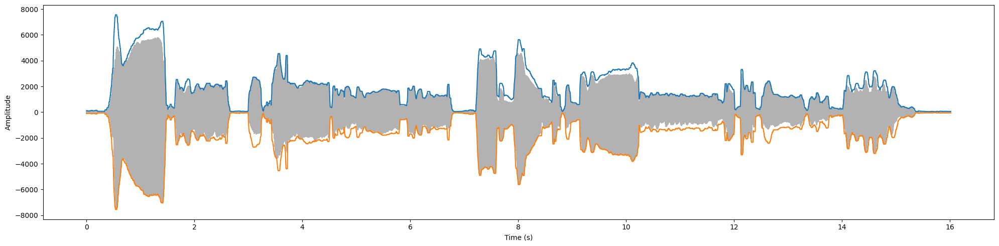

In [15]:
WIN_SIZE = 0.025
HOP_SIZE = 0.001

sr, data = io.wavfile.read(dir_files+'LP-mem-6-a.wav')

# calcular el valor máximo para cada trama de la señal
max_amp, t_max = max_corto_plazo(data, sr, WIN_SIZE, HOP_SIZE)

# longitud de la señal en muestras
L = data.shape[0]

# marcas de tiempo para las muestras de la señal
t = np.linspace(0, L / sr, L)


# plot corto plazo y la señal de audio
plt.figure(figsize=(20,5))
plt.plot(t, data, 'k', alpha=0.3)
plt.plot(t_max, max_amp)
plt.plot(t_max, -max_amp)
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')
plt.tight_layout()